In [ ]:
import numpy as np
import tensorflow as tf
import albumentations as A
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models, callbacks
from tensorflow.keras.utils import Sequence
from tqdm import tqdm

warnings.filterwarnings("ignore")

In [ ]:
# CONFIGURATION (SAME AS PATCH MODEL)
# ============================================
class CFG:
    # Paths (same as patch model)
    IMAGE_FOLDER = "/kaggle/input/datasets/najiyanizam/blueberry-segmentation-dataset/Images_png"
    MASK_FOLDER = "/kaggle/input/datasets/najiyanizam/blueberry-segmentation-dataset/Masks"
    SAVE_DIR = "/kaggle/working"

    # For baseline (full images)
    IMG_SIZE = 512  # Standard size for full images (not 256!)
    BATCH_SIZE = 8  # Smaller because full images are larger
    EPOCHS = 50
    LR = 1e-4
    RANDOM_STATE = 42

    # For evaluation (same as patch model)
    INFER_STRIDE = 128

    # Same ripeness ranges
    RIPENESS_RANGES = {
        "unripe": [(25, 40, 40), (85, 255, 255)],
        "semi_ripe": [(140, 40, 40), (175, 255, 255)],
        "ripe": [(100, 40, 30), (140, 255, 255)],
        "overripe": [(100, 40, 0), (140, 255, 40)],
    }

os.makedirs(CFG.SAVE_DIR, exist_ok=True)
print("Config ready.")

Config ready.


In [ ]:
# SAME TRAIN/VAL/TEST SPLIT (70/15/15)
# ============================================
images = sorted(os.listdir(CFG.IMAGE_FOLDER))

train_images, temp_images = train_test_split(
    images, test_size=0.30, random_state=CFG.RANDOM_STATE
)
val_images, test_images = train_test_split(
    temp_images, test_size=0.50, random_state=CFG.RANDOM_STATE
)

print("="*40)
print(f"Total images: {len(images)}")
print(f"Train: {len(train_images)}")
print(f"Val: {len(val_images)}")
print(f"Test: {len(test_images)}")
print("="*40)

Total images: 1195
Train: 836
Val: 179
Test: 180


In [ ]:
# DATASET LOADER (FULL IMAGES - NO PATCHING)
# ============================================
class FullImageDataset(Sequence):
    def __init__(self, image_list, img_size=512, augment=False):
        self.image_list = image_list
        self.img_size = img_size
        self.augment = augment

        # Same augmentations as patch model (for fair comparison)
        self.train_transform = A.Compose([
            A.Resize(img_size, img_size),
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.3),
            A.RandomRotate90(p=0.5),
            A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=20, p=0.7),
            A.RandomBrightnessContrast(p=0.5),
        ])

        self.val_transform = A.Compose([
            A.Resize(img_size, img_size),
        ])

    def __len__(self):
        return int(np.ceil(len(self.image_list) / CFG.BATCH_SIZE))

    def __getitem__(self, idx):
        batch = self.image_list[idx*CFG.BATCH_SIZE:(idx+1)*CFG.BATCH_SIZE]
        imgs, masks = [], []

        for name in batch:
            # Load image
            img_path = os.path.join(CFG.IMAGE_FOLDER, name)
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Load mask
            mask_path = os.path.join(CFG.MASK_FOLDER, name)
            mask = cv2.imread(mask_path, 0)
            mask = (mask > 0).astype(np.float32)

            # Apply transforms
            if self.augment:
                aug = self.train_transform(image=img, mask=mask)
            else:
                aug = self.val_transform(image=img, mask=mask)

            img = aug["image"] / 255.0
            mask = np.expand_dims(aug["mask"], axis=-1)

            imgs.append(img)
            masks.append(mask)

        return np.array(imgs, dtype=np.float32), np.array(masks, dtype=np.float32)

# Create datasets
train_data = FullImageDataset(train_images, img_size=CFG.IMG_SIZE, augment=True)
val_data = FullImageDataset(val_images, img_size=CFG.IMG_SIZE, augment=False)
test_data = FullImageDataset(test_images, img_size=CFG.IMG_SIZE, augment=False)

print(f"Train batches: {len(train_data)}")
print(f"Val batches: {len(val_data)}")
print(f"Test batches: {len(test_data)}")

Train batches: 105
Val batches: 23
Test batches: 23


In [ ]:
# SAME LOSS FUNCTIONS (IDENTICAL TO PATCH MODEL)
# ============================================
def dice_loss(y_true, y_pred):
    smooth = 1e-6
    y_true_f = tf.cast(tf.reshape(y_true, [-1]), tf.float32)
    y_pred_f = tf.cast(tf.reshape(y_pred, [-1]), tf.float32)
    inter = tf.reduce_sum(y_true_f * y_pred_f)
    return 1.0 - (2.0 * inter + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def focal_loss(y_true, y_pred, gamma=2.0, alpha=0.75):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)
    bce = -(y_true * tf.math.log(y_pred) + (1.0 - y_true) * tf.math.log(1.0 - y_pred))
    pt = tf.exp(-bce)
    return tf.reduce_mean(alpha * (1.0 - pt) ** gamma * bce)

def combined_loss(y_true, y_pred):
    return dice_loss(y_true, y_pred) + focal_loss(y_true, y_pred)

def dice_score(y_true, y_pred):
    smooth = 1e-6
    y_true = tf.cast(y_true, tf.float32)
    y_pred_b = tf.cast(y_pred > 0.5, tf.float32)
    inter = tf.reduce_sum(y_true * y_pred_b)
    return (2.0 * inter + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_b) + smooth)

def iou_score(y_true, y_pred):
    smooth = 1e-6
    y_true = tf.cast(y_true, tf.float32)
    y_pred_b = tf.cast(y_pred > 0.5, tf.float32)
    inter = tf.reduce_sum(y_true * y_pred_b)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_b) - inter
    return (inter + smooth) / (union + smooth)


In [ ]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras import layers, models

# Quick test to get actual shapes
test_input = layers.Input(shape=(512, 512, 3))
backbone = ResNet50V2(include_top=False, weights='imagenet', input_tensor=test_input)

print("Actual ResNet50V2 output shapes for 512×512 input:")
print("="*50)

for layer in backbone.layers:
    if 'conv' in layer.name and 'block' in layer.name:
        print(f"{layer.name}: {layer.output.shape}")
    if layer.name == 'conv1_conv':
        print(f"conv1_conv: {layer.output.shape}")
    if layer.name == 'conv5_block3_out':
        print(f"bottleneck: {layer.output.shape}")
        break

Actual ResNet50V2 output shapes for 512×512 input:
conv1_conv: (None, 256, 256, 64)
conv2_block1_preact_bn: (None, 128, 128, 64)
conv2_block1_preact_relu: (None, 128, 128, 64)
conv2_block1_1_conv: (None, 128, 128, 64)
conv2_block1_1_bn: (None, 128, 128, 64)
conv2_block1_1_relu: (None, 128, 128, 64)
conv2_block1_2_pad: (None, 130, 130, 64)
conv2_block1_2_conv: (None, 128, 128, 64)
conv2_block1_2_bn: (None, 128, 128, 64)
conv2_block1_2_relu: (None, 128, 128, 64)
conv2_block1_0_conv: (None, 128, 128, 256)
conv2_block1_3_conv: (None, 128, 128, 256)
conv2_block1_out: (None, 128, 128, 256)
conv2_block2_preact_bn: (None, 128, 128, 256)
conv2_block2_preact_relu: (None, 128, 128, 256)
conv2_block2_1_conv: (None, 128, 128, 64)
conv2_block2_1_bn: (None, 128, 128, 64)
conv2_block2_1_relu: (None, 128, 128, 64)
conv2_block2_2_pad: (None, 130, 130, 64)
conv2_block2_2_conv: (None, 128, 128, 64)
conv2_block2_2_bn: (None, 128, 128, 64)
conv2_block2_2_relu: (None, 128, 128, 64)
conv2_block2_3_conv: (None

In [ ]:
def build_corrected_baseline_unet(input_shape=(512, 512, 3)):
    """
    U-Net with ResNet50V2 backbone - CORRECTED VERSION
    Properly handles all shape mismatches
    """

    # Input
    inputs = layers.Input(shape=input_shape)

    # ResNet50V2 backbone
    backbone = ResNet50V2(include_top=False, weights='imagenet', input_tensor=inputs)
    backbone.trainable = True

    # Get encoder outputs based on ACTUAL shapes from your analysis
    s1 = backbone.get_layer('conv1_conv').output              # 256x256x64
    s2 = backbone.get_layer('conv2_block3_out').output        # 64x64x256
    s3 = backbone.get_layer('conv3_block4_out').output        # 32x32x512
    s4 = backbone.get_layer('conv4_block6_out').output        # 16x16x1024
    bottleneck = backbone.get_layer('conv5_block3_out').output # 16x16x2048

    print(f"\nEncoder shapes:")
    print(f"  s1: {s1.shape}")
    print(f"  s2: {s2.shape}")
    print(f"  s3: {s3.shape}")
    print(f"  s4: {s4.shape}")
    print(f"  bottleneck: {bottleneck.shape}")

    # Decoder path

    # Up 1: 16x16 -> 32x32 (match s3 which is 32x32)
    x = layers.Conv2DTranspose(512, (3,3), strides=2, padding='same')(bottleneck)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    # Now x is 32x32x512, s3 is 32x32x512 - MATCH!
    x = layers.concatenate([x, s3])
    x = layers.Conv2D(512, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(512, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    # Up 2: 32x32 -> 64x64 (match s2 which is 64x64)
    x = layers.Conv2DTranspose(256, (3,3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    # Now x is 64x64x256, s2 is 64x64x256 - MATCH!
    x = layers.concatenate([x, s2])
    x = layers.Conv2D(256, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(256, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    # Up 3: 64x64 -> 128x128
    x = layers.Conv2DTranspose(128, (3,3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    # Now x is 128x128x128, need to match with s1 (256x256x64)
    # We'll go to 256x256 in next step

    # Up 4: 128x128 -> 256x256 (match s1 which is 256x256)
    x = layers.Conv2DTranspose(64, (3,3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    # Now x is 256x256x64, s1 is 256x256x64 - MATCH!
    x = layers.concatenate([x, s1])
    x = layers.Conv2D(64, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(64, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    # Up 5: 256x256 -> 512x512 (final output size)
    x = layers.Conv2DTranspose(32, (3,3), strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Final convolutions
    x = layers.Conv2D(32, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(16, (3,3), padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)

    # Output
    outputs = layers.Conv2D(1, (1,1), activation='sigmoid')(x)

    model = models.Model(inputs=inputs, outputs=outputs, name="ResNet50V2_UNet_Baseline")

    return model

In [ ]:
# BUILD MODEL
# ============================================
print("\n" + "="*50)
print("BUILDING CORRECTED BASELINE MODEL")
print("="*50)

model = build_corrected_baseline_unet(input_shape=(CFG.IMG_SIZE, CFG.IMG_SIZE, 3))
print(f"\nTotal parameters: {model.count_params():,}")
print("Model built successfully!")

# Show summary
model.summary()


BUILDING CORRECTED BASELINE MODEL

Encoder shapes:
  s1: (None, 256, 256, 64)
  s2: (None, 64, 64, 256)
  s3: (None, 32, 32, 512)
  s4: (None, 16, 16, 1024)
  bottleneck: (None, 16, 16, 2048)

Total parameters: 43,545,825
Model built successfully!


Model: "ResNet50V2_UNet_Baseline"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 518, 518,  │          0 │ input_layer_5[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 256, 256,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 258, 258,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 128, 128,  │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 128, 128,  │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 128, 128,  │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 128, 128,  │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 128, 128,  │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 128, 128,  │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 130, 130,  │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 128, 128,  │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 128, 128,  │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 128, 128,  │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 128, 128,  │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 128, 128,  │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 128, 128,  │          0 │ conv2_block1_0_c

 Total params: 43,545,825 (166.11 MB)

 Trainable params: 43,499,073 (165.94 MB)

 Non-trainable params: 46,752 (182.62 KB)

In [ ]:
# COMPILE
# ============================================
model.compile(
    optimizer=tf.keras.optimizers.Adam(CFG.LR),
    loss=combined_loss,
    metrics=[dice_score, iou_score]
)
print("\nModel compiled successfully.")



Model compiled successfully.


In [ ]:
# CALLBACKS
# ============================================
cb_list = [
    callbacks.ModelCheckpoint(
        "/kaggle/working/baseline_model.keras",
        monitor="val_iou_score",
        save_best_only=True,
        mode="max",
        verbose=1
    ),
    callbacks.ReduceLROnPlateau(
        monitor="val_iou_score",
        factor=0.5,
        patience=5,
        mode="max",
        verbose=1
    ),
    callbacks.EarlyStopping(
        monitor="val_iou_score",
        patience=10,
        mode="max",
        restore_best_weights=True,
        verbose=1
    ),
]


In [ ]:
# TRAIN
# ============================================
print("\n" + "="*50)
print("STARTING TRAINING")
print("="*50)

history = model.fit(
    train_data,
    validation_data=val_data,
    epochs=CFG.EPOCHS,
    callbacks=cb_list,
    verbose=1
)


STARTING TRAINING
Epoch 1/50


I0000 00:00:1776695205.085798     171 service.cc:152] XLA service 0x78c748022ba0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1776695205.085841     171 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1776695205.085846     171 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1776695211.281263     171 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-04-20 14:27:03.981311: E external/local_xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng12{k11=2} for conv %cudnn-conv-bias-activation.156 = (f32[8,512,32,32]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,512,32,32]{3,2,1,0} %bitcast.74985, f32[512,512,3,3]{3,2,1,0} %bitcast.56268, f32[512]{0} %bitcast.75045), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", metadata={op_type="Conv2D" op_name="ResNet50V2_UNet_Baseline_1/conv2d_2_1/con

100/105 ━━━━━━━━━━━━━━━━━━━━ 6s 1s/step - dice_score: 0.1958 - iou_score: 0.1136 - loss: 1.0436

2026-04-20 14:30:49.955257: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-20 14:30:50.261441: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-20 14:31:00.711868: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-20 14:31:01.021615: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-20 14:31:01.508640: E external/local_xla/xla/stream_

105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - dice_score: 0.2013 - iou_score: 0.1175 - loss: 1.0412

2026-04-20 14:32:42.229694: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-20 14:32:42.535436: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_iou_score improved from -inf to 0.27122, saving model to /kaggle/working/baseline_model.keras
105/105 ━━━━━━━━━━━━━━━━━━━━ 400s 3s/step - dice_score: 0.2024 - iou_score: 0.1183 - loss: 1.0408 - val_dice_score: 0.4239 - val_iou_score: 0.2712 - val_loss: 0.9752 - learning_rate: 1.0000e-04
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - dice_score: 0.5230 - iou_score: 0.3632 - loss: 0.9312
Epoch 2: val_iou_score improved from 0.27122 to 0.53895, saving model to /kaggle/working/baseline_model.keras
105/105 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - dice_score: 0.5233 - iou_score: 0.3635 - loss: 0.9311 - val_dice_score: 0.6968 - val_iou_score: 0.5389 - val_loss: 0.9103 - learning_rate: 1.0000e-04
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - dice_score: 0.6083 - iou_score: 0.4481 - loss: 0.9046
Epoch 3: val_iou_score improved from 0.53895 to 0.60487, saving model to /kaggle/working/baseline_model.keras
105/105 ━━━━━━━━━━━━━━━━━━━━ 154s 1s/step - dice_score: 0.6085 - iou_s

In [ ]:
# EVALUATE
# ============================================
print("\n" + "="*50)
print("TEST SET EVALUATION")
print("="*50)

test_results = model.evaluate(test_data, verbose=1)
print(f"\n{'='*50}")
print(f"BASELINE TEST RESULTS:")
print(f"{'='*50}")
print(f"Loss: {test_results[0]:.4f}")
print(f"Dice Score: {test_results[1]:.4f}")
print(f"IoU Score: {test_results[2]:.4f}")
print(f"{'='*50}")


TEST SET EVALUATION
22/23 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - dice_score: 0.8643 - iou_score: 0.7627 - loss: 0.2051

2026-04-20 16:38:24.773814: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-20 16:38:25.079128: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


23/23 ━━━━━━━━━━━━━━━━━━━━ 40s 2s/step - dice_score: 0.8636 - iou_score: 0.7618 - loss: 0.2056

BASELINE TEST RESULTS:
Loss: 0.2116
Dice Score: 0.8565
IoU Score: 0.7512


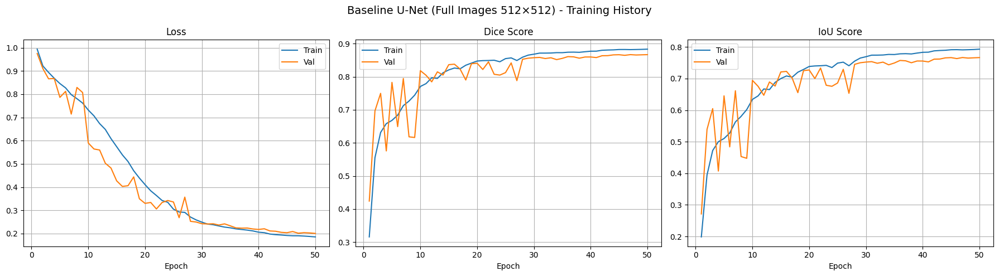


Best Validation IoU: 0.7667
Best Validation Dice: 0.8671


In [ ]:
# PLOT TRAINING HISTORY
# ============================================
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

epochs_range = range(1, len(history.history['loss']) + 1)

axes[0].plot(epochs_range, history.history['loss'], label='Train')
axes[0].plot(epochs_range, history.history['val_loss'], label='Val')
axes[0].set_title('Loss')
axes[0].set_xlabel('Epoch')
axes[0].legend()
axes[0].grid(True)

axes[1].plot(epochs_range, history.history['dice_score'], label='Train')
axes[1].plot(epochs_range, history.history['val_dice_score'], label='Val')
axes[1].set_title('Dice Score')
axes[1].set_xlabel('Epoch')
axes[1].legend()
axes[1].grid(True)

axes[2].plot(epochs_range, history.history['iou_score'], label='Train')
axes[2].plot(epochs_range, history.history['val_iou_score'], label='Val')
axes[2].set_title('IoU Score')
axes[2].set_xlabel('Epoch')
axes[2].legend()
axes[2].grid(True)

plt.suptitle('Baseline U-Net (Full Images 512×512) - Training History', fontsize=14)
plt.tight_layout()
plt.savefig('/kaggle/working/baseline_training_history.png', dpi=150)
plt.show()

# Print best metrics
print(f"\nBest Validation IoU: {max(history.history['val_iou_score']):.4f}")
print(f"Best Validation Dice: {max(history.history['val_dice_score']):.4f}")

In [ ]:
# SAVE RESULTS FOR COMPARISON
# ============================================
import json

baseline_results = {
    'test_loss': float(test_results[0]),
    'test_dice': float(test_results[1]),
    'test_iou': float(test_results[2]),
    'best_val_iou': float(max(history.history['val_iou_score'])),
    'best_val_dice': float(max(history.history['val_dice_score'])),
    'config': {
        'img_size': CFG.IMG_SIZE,
        'batch_size': CFG.BATCH_SIZE,
        'epochs': CFG.EPOCHS,
        'lr': CFG.LR,
    }
}

with open('/kaggle/working/baseline_results.json', 'w') as f:
    json.dump(baseline_results, f, indent=2)

In [ ]:
import os, cv2, random, warnings
import numpy as np
import tensorflow as tf
import albumentations as A
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy import ndimage
from skimage.feature import peak_local_max
from skimage.segmentation import watershed, mark_boundaries
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models
from tqdm import tqdm

warnings.filterwarnings("ignore")
print("Imports done.")

Imports done.


In [ ]:
class CFG:
    IMAGE_FOLDER  = "/kaggle/input/datasets/najiyanizam/blueberry-segmentation-dataset/Images_png"
    MASK_FOLDER   = "/kaggle/input/datasets/najiyanizam/blueberry-segmentation-dataset/Masks"
    SAVE_DIR      = "/kaggle/working"
    MODEL_PATH    = "/kaggle/input/datasets/najiyanizam/unet-baseline-model/baseline_model.keras"
    IMG_SIZE      = 512
    BATCH_SIZE    = 8
    RANDOM_STATE  = 42
    INFER_STRIDE  = 128   # for sliding window

    RIPENESS_RANGES = {
        "unripe":    [(25,  40,  40),  (85,  255, 255)],
        "semi_ripe": [(140, 40,  40),  (175, 255, 255)],
        "ripe":      [(100, 40,  30),  (140, 255, 255)],
        "overripe":  [(100, 40,  0),   (140, 255, 40)],
    }

os.makedirs(CFG.SAVE_DIR, exist_ok=True)
print("Config ready.")

Config ready.


In [ ]:
def dice_loss(y_true, y_pred):
    smooth   = 1e-6
    y_true_f = tf.cast(tf.reshape(y_true, [-1]), tf.float32)
    y_pred_f = tf.cast(tf.reshape(y_pred, [-1]), tf.float32)
    inter    = tf.reduce_sum(y_true_f * y_pred_f)
    return 1.0 - (2.0 * inter + smooth) / (
        tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth
    )

def focal_loss(y_true, y_pred, gamma=2.0, alpha=0.75):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = tf.clip_by_value(y_pred, 1e-7, 1.0 - 1e-7)
    bce    = -(  y_true       * tf.math.log(y_pred)
              + (1.0 - y_true) * tf.math.log(1.0 - y_pred))
    pt     = tf.exp(-bce)
    return tf.reduce_mean(alpha * (1.0 - pt) ** gamma * bce)

def combined_loss(y_true, y_pred):
    return dice_loss(y_true, y_pred) + focal_loss(y_true, y_pred)

def dice_score(y_true, y_pred):
    smooth   = 1e-6
    y_true   = tf.cast(y_true,       tf.float32)
    y_pred_b = tf.cast(y_pred > 0.5, tf.float32)
    inter    = tf.reduce_sum(y_true * y_pred_b)
    return (2.0 * inter + smooth) / (
        tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_b) + smooth
    )

def iou_score(y_true, y_pred):
    smooth   = 1e-6
    y_true   = tf.cast(y_true,       tf.float32)
    y_pred_b = tf.cast(y_pred > 0.5, tf.float32)
    inter    = tf.reduce_sum(y_true * y_pred_b)
    union    = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred_b) - inter
    return (inter + smooth) / (union + smooth)

print("Loss functions ready.")

Loss functions ready.


In [ ]:
model = tf.keras.models.load_model(
    CFG.MODEL_PATH,
    custom_objects={
        "combined_loss": combined_loss,
        "dice_score":    dice_score,
        "iou_score":     iou_score,
    }
)
print("Model loaded successfully.")
print(f"Input shape : {model.input_shape}")
print(f"Output shape: {model.output_shape}")

I0000 00:00:1776731015.064792      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1776731015.071068      55 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model loaded successfully.
Input shape : (None, 512, 512, 3)
Output shape: (None, 512, 512, 1)


In [ ]:
# Since this is a full-image model (512x512),
# we simply resize the image and predict directly.
# No sliding window needed — the model already sees the full image.


def predict_image(model, img_rgb, threshold=0.5):
    """
    Simple full-image prediction.
    Resize → normalize → predict → resize back to original.
    """
    orig_h, orig_w = img_rgb.shape[:2]

    # Resize to model input size
    img_resized = cv2.resize(img_rgb,
                             (CFG.IMG_SIZE, CFG.IMG_SIZE))

    # Normalize to [0, 1]
    img_norm = img_resized.astype(np.float32) / 255.0

    # Predict
    prob = model.predict(
        img_norm[np.newaxis], verbose=0
    )[0, :, :, 0]

    # Binarise with threshold
    pred = (prob > threshold).astype(np.uint8)

    # Resize prediction back to original image size
    pred_orig = cv2.resize(
        pred, (orig_w, orig_h),
        interpolation=cv2.INTER_NEAREST
    )
    prob_orig = cv2.resize(prob, (orig_w, orig_h))

    return prob_orig, pred_orig

print("Inference function ready.")

Inference function ready.


In [ ]:
images = sorted(os.listdir(CFG.IMAGE_FOLDER))

train_imgs, temp_imgs = train_test_split(
    images, test_size=0.30, random_state=CFG.RANDOM_STATE
)
val_imgs, test_imgs = train_test_split(
    temp_imgs, test_size=0.50, random_state=CFG.RANDOM_STATE
)

print(f"Train: {len(train_imgs)}")
print(f"Val  : {len(val_imgs)}")
print(f"Test : {len(test_imgs)}")

Train: 836
Val  : 179
Test : 180


In [ ]:
def tune_threshold(image_list,
                   thresholds=[0.20, 0.25, 0.30, 0.35, 0.40, 0.45,
                               0.50, 0.55, 0.60],
                   num_samples=179):
    sample  = random.sample(image_list,
                            min(num_samples, len(image_list)))
    results = {}
    print("Finding best threshold...")
    print("-" * 50)

    for thresh in thresholds:
        iou_list, dice_list = [], []
        for name in tqdm(sample,
                         desc=f"thresh={thresh:.2f}",
                         leave=False):
            img  = cv2.imread(
                os.path.join(CFG.IMAGE_FOLDER, name))
            img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            mask = cv2.imread(
                os.path.join(CFG.MASK_FOLDER, name), 0)
            mask = (mask > 0).astype(np.uint8)

            _, pred = predict_image(model, img,
                                    threshold=thresh)

            # Resize mask to match pred
            mask_r = cv2.resize(
                mask, (pred.shape[1], pred.shape[0]),
                interpolation=cv2.INTER_NEAREST
            )

            inter = np.sum(pred * mask_r)
            union = np.sum(pred) + np.sum(mask_r) - inter
            iou_list.append((inter + 1e-6) / (union + 1e-6))
            dice_list.append(
                (2 * inter + 1e-6) /
                (np.sum(pred) + np.sum(mask_r) + 1e-6)
            )

        results[thresh] = {
            "iou":  round(float(np.mean(iou_list)),  4),
            "dice": round(float(np.mean(dice_list)), 4),
        }
        print(f"  {thresh:.2f} → "
              f"IoU: {results[thresh]['iou']:.4f} | "
              f"Dice: {results[thresh]['dice']:.4f}")

    best = max(results, key=lambda t: results[t]["iou"])
    print("-" * 50)
    print(f"Best threshold : {best}")
    print(f"Best IoU       : {results[best]['iou']:.4f}")
    print(f"Best Dice      : {results[best]['dice']:.4f}")
    return best, results


best_thresh, thresh_results = tune_threshold(val_imgs)

Finding best threshold...
--------------------------------------------------


thresh=0.20:   0%|          | 0/179 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1776731107.430727     126 service.cc:152] XLA service 0x7d72a4007440 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1776731107.430769     126 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1776731107.430773     126 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1776731108.558446     126 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-04-21 00:25:14.372824: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-04-21 00:25:14.625795: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optim

  0.20 → IoU: 0.6983 | Dice: 0.8086


  0.25 → IoU: 0.6993 | Dice: 0.8091


  0.30 → IoU: 0.6993 | Dice: 0.8088


  0.35 → IoU: 0.6988 | Dice: 0.8081


  0.40 → IoU: 0.6979 | Dice: 0.8071


  0.45 → IoU: 0.6967 | Dice: 0.8059


  0.50 → IoU: 0.6954 | Dice: 0.8047


  0.55 → IoU: 0.6940 | Dice: 0.8034


  0.60 → IoU: 0.6922 | Dice: 0.8018
--------------------------------------------------
Best threshold : 0.25
Best IoU       : 0.6993
Best Dice      : 0.8091


In [ ]:
print("=" * 55)
print(f"  FINAL EVALUATION — threshold = {best_thresh}")
print("=" * 55)

final_iou_list  = []
final_dice_list = []

for name in tqdm(test_imgs, desc="Test eval"):
    img  = cv2.imread(os.path.join(CFG.IMAGE_FOLDER, name))
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(os.path.join(CFG.MASK_FOLDER, name), 0)
    mask = (mask > 0).astype(np.uint8)

    _, pred = predict_image(model, img,
                            threshold=best_thresh)

    mask_r = cv2.resize(
        mask, (pred.shape[1], pred.shape[0]),
        interpolation=cv2.INTER_NEAREST
    )

    inter = np.sum(pred * mask_r)
    union = np.sum(pred) + np.sum(mask_r) - inter
    final_iou_list.append((inter + 1e-6) / (union + 1e-6))
    final_dice_list.append(
        (2 * inter + 1e-6) /
        (np.sum(pred) + np.sum(mask_r) + 1e-6)
    )

final_iou  = float(np.mean(final_iou_list))
final_dice = float(np.mean(final_dice_list))

print(f"\nFinal Test IoU  : {final_iou:.4f}")
print(f"Final Test Dice : {final_dice:.4f}")


  FINAL EVALUATION — threshold = 0.25


Test eval: 100%|██████████| 180/180 [00:54<00:00,  3.33it/s]


Final Test IoU  : 0.6837
Final Test Dice : 0.7965


In [ ]:
# ── Watershed only (no CHT as requested) ───────────────────

def apply_watershed(binary_mask):
    """
    Separate touching fruits using watershed algorithm.
    Distance transform finds fruit centres as seeds,
    watershed floods outward creating boundaries between fruits.
    """
    mask   = (binary_mask > 0).astype(np.uint8)
    dist   = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
    coords = peak_local_max(dist, min_distance=15, labels=mask)
    m      = np.zeros(dist.shape, dtype=bool)
    m[tuple(coords.T)] = True
    markers, _ = ndimage.label(m)
    labels      = watershed(-dist, markers, mask=mask)
    return labels, dist


def analyze_components(ws_labels):
    """
    Extract per-fruit statistics from watershed regions.
    Returns list of dicts with area, circularity, centroid.
    """
    results = []
    for label in np.unique(ws_labels):
        if label == 0: continue
        comp  = (ws_labels == label).astype(np.uint8)
        area  = int(np.sum(comp))
        if area < 50: continue       # ignore noise
        cnts, _ = cv2.findContours(
            comp, cv2.RETR_EXTERNAL,
            cv2.CHAIN_APPROX_SIMPLE
        )
        if not cnts: continue
        perim = cv2.arcLength(cnts[0], True)
        circ  = (4 * np.pi * area / perim**2
                 ) if perim > 0 else 0
        M  = cv2.moments(comp)
        cx = int(M["m10"]/M["m00"]) if M["m00"] > 0 else 0
        cy = int(M["m01"]/M["m00"]) if M["m00"] > 0 else 0
        results.append({
            "label":       int(label),
            "area":        area,
            "circularity": round(circ, 3),
            "centroid":    (cx, cy)
        })
    return results


def compute_yield_metrics(binary_mask, components, D=512):
    """
    Compute both yield metrics:
    1. Yield Density  = fruit pixels / total pixels (area-based)
    2. Fruit Count    = number of individual fruits (count-based)
    3. Enhanced Yield = density × log(1 + count) — combines both
    """
    total_pixels = D * D
    fruit_pixels = int(np.sum(binary_mask > 0))
    fruit_count  = len(components)
    total_area   = sum(c["area"] for c in components)

    yield_density  = round(fruit_pixels / total_pixels, 4)
    # Enhanced index combines area coverage and fruit count
    enhanced_yield = round(
        yield_density * np.log1p(fruit_count), 4
    )

    return {
        "fruit_count":     fruit_count,
        "fruit_area_px":   fruit_pixels,
        "total_comp_area": total_area,
        "yield_density":   yield_density,
        "enhanced_yield":  enhanced_yield,
    }


def classify_ripeness(img_rgb, binary_mask):
    """
    HSV colour analysis on segmented fruit pixels only.
    Returns pixel counts and percentages per ripeness stage.
    """
    mask_bool = binary_mask > 0
    img_u8    = (img_rgb if img_rgb.dtype == np.uint8
                 else (img_rgb * 255).astype(np.uint8))
    bgr = cv2.cvtColor(img_u8, cv2.COLOR_RGB2BGR)
    hsv = cv2.cvtColor(bgr, cv2.COLOR_BGR2HSV)

    total_px          = int(np.sum(mask_bool))
    counts, rip_masks = {}, {}

    for stage, (lo, hi) in CFG.RIPENESS_RANGES.items():
        cm               = cv2.inRange(
            hsv, np.array(lo), np.array(hi))
        combined         = cm & (
            mask_bool.astype(np.uint8) * 255)
        counts[stage]    = int(np.sum(combined > 0))
        rip_masks[stage] = combined

    pcts = {
        s: round(c / total_px * 100, 2)
        if total_px > 0 else 0.0
        for s, c in counts.items()
    }
    return counts, pcts, rip_masks

print("Pipeline helper functions ready.")

Pipeline helper functions ready.


In [ ]:
def run_comparison_pipeline(img_name, threshold,
                             save_fig=True):
    """
    Runs full pipeline on BOTH ground truth and predicted mask.
    Compares yield and ripeness estimates side by side.
    """

    # ── Load ────────────────────────────────────────────────
    img  = cv2.imread(
        os.path.join(CFG.IMAGE_FOLDER, img_name))
    img  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gt   = cv2.imread(
        os.path.join(CFG.MASK_FOLDER, img_name), 0)
    gt   = (gt > 0).astype(np.uint8)

    # ── Predict ─────────────────────────────────────────────
    _, pred_mask = predict_image(model, img,
                                  threshold=threshold)

    # Resize everything to 512 for consistent processing
    D      = 512
    img_d  = cv2.resize(img, (D, D))
    gt_d   = cv2.resize(
        gt, (D, D), interpolation=cv2.INTER_NEAREST)
    pred_d = cv2.resize(
        pred_mask, (D, D),
        interpolation=cv2.INTER_NEAREST)

    # Segmentation IoU
    inter   = np.sum(pred_d * gt_d)
    union   = np.sum(pred_d) + np.sum(gt_d) - inter
    seg_iou = (inter + 1e-6) / (union + 1e-6)

    # ── Ground Truth Pipeline ───────────────────────────────
    gt_ws, gt_dist = apply_watershed(gt_d)
    gt_comps       = analyze_components(gt_ws)
    gt_yield       = compute_yield_metrics(gt_d, gt_comps, D)
    _, gt_pcts, gt_rips = classify_ripeness(img_d, gt_d)

    # ── Predicted Pipeline ──────────────────────────────────
    pr_ws, pr_dist = apply_watershed(pred_d)
    pr_comps       = analyze_components(pr_ws)
    pr_yield       = compute_yield_metrics(pred_d, pr_comps, D)
    _, pr_pcts, pr_rips = classify_ripeness(img_d, pred_d)

    # ── Errors ──────────────────────────────────────────────
    count_err = abs(pr_yield["fruit_count"] -
                    gt_yield["fruit_count"])
    count_err_pct = round(
        count_err / max(gt_yield["fruit_count"], 1) * 100, 1)

    density_err_pct = round(
        abs(pr_yield["yield_density"] -
            gt_yield["yield_density"]) /
        max(gt_yield["yield_density"], 1e-6) * 100, 1)

    enhanced_err_pct = round(
        abs(pr_yield["enhanced_yield"] -
            gt_yield["enhanced_yield"]) /
        max(gt_yield["enhanced_yield"], 1e-6) * 100, 1)

    # ── Build overlays ──────────────────────────────────────
    color_map = {
        "unripe":    (0,   200, 0),
        "semi_ripe": (200, 0,   200),
        "ripe":      (0,   0,   255),
        "overripe":  (50,  50,  50),
    }

    gt_rip_ov = img_d.copy()
    for s, rm in gt_rips.items():
        gt_rip_ov[rm > 0] = color_map[s]

    pr_rip_ov = img_d.copy()
    for s, rm in pr_rips.items():
        pr_rip_ov[rm > 0] = color_map[s]

    gt_bound = (mark_boundaries(
        img_d, gt_ws, color=(0, 1, 0)) * 255
    ).astype(np.uint8)
    for i, c in enumerate(gt_comps):
        cx, cy = c["centroid"]
        cv2.putText(gt_bound, str(i+1), (cx-5, cy+5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.35,
                    (255, 255, 0), 1)

    pr_bound = (mark_boundaries(
        img_d, pr_ws, color=(1, 0, 0)) * 255
    ).astype(np.uint8)
    for i, c in enumerate(pr_comps):
        cx, cy = c["centroid"]
        cv2.putText(pr_bound, str(i+1), (cx-5, cy+5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.35,
                    (255, 255, 0), 1)

    seg_ov = img_d.copy()
    seg_ov[pred_d == 1] = [255, 50, 50]

    safe = img_name.replace(".png","").replace(" ","_")

    # ════════════════════════════════════════════════════════
    # FIGURE 1 — Segmentation
    # ════════════════════════════════════════════════════════
    fig1, axes1 = plt.subplots(1, 4, figsize=(24, 6))
    axes1[0].imshow(img_d)
    axes1[0].set_title("Original Image", fontsize=12)
    axes1[1].imshow(gt_d, cmap="gray")
    axes1[1].set_title("Ground Truth Mask", fontsize=12)
    axes1[2].imshow(pred_d, cmap="gray")
    axes1[2].set_title(
        f"Predicted Mask\nIoU: {seg_iou:.4f}", fontsize=12)
    axes1[3].imshow(seg_ov)
    axes1[3].set_title(
        "Segmentation Overlay\n(Red = Predicted Fruit)",
        fontsize=12)
    for ax in axes1: ax.axis("off")
    fig1.suptitle(f"Segmentation — {img_name}",
                  fontsize=13, y=1.02)
    fig1.tight_layout(pad=2.0)
    if save_fig:
        fig1.savefig(
            os.path.join(CFG.SAVE_DIR,
                         f"seg_{safe}.png"),
            dpi=130, bbox_inches="tight")
    plt.show()

    # ════════════════════════════════════════════════════════
    # FIGURE 2 — Watershed Comparison
    # ════════════════════════════════════════════════════════
    fig2, axes2 = plt.subplots(1, 2, figsize=(18, 7))

    axes2[0].imshow(gt_bound)
    axes2[0].set_title(
        f"GROUND TRUTH — Watershed\n"
        f"Count: {gt_yield['fruit_count']}  |  "
        f"Density: {gt_yield['yield_density']:.4f}  |  "
        f"Enhanced Yield: {gt_yield['enhanced_yield']:.4f}",
        fontsize=11, pad=10)

    axes2[1].imshow(pr_bound)
    axes2[1].set_title(
        f"PREDICTED — Watershed\n"
        f"Count: {pr_yield['fruit_count']}  |  "
        f"Density: {pr_yield['yield_density']:.4f}  |  "
        f"Enhanced Yield: {pr_yield['enhanced_yield']:.4f}",
        fontsize=11, pad=10)

    for ax in axes2: ax.axis("off")
    fig2.suptitle(
        f"Yield Estimation — GT vs Predicted | {img_name}\n"
        f"Count Error: {count_err_pct}%  |  "
        f"Density Error: {density_err_pct}%  |  "
        f"Enhanced Yield Error: {enhanced_err_pct}%",
        fontsize=12, y=1.02)
    fig2.tight_layout(pad=2.5)
    if save_fig:
        fig2.savefig(
            os.path.join(CFG.SAVE_DIR,
                         f"yield_{safe}.png"),
            dpi=130, bbox_inches="tight")
    plt.show()

    # ════════════════════════════════════════════════════════
    # FIGURE 3 — Ripeness Comparison
    # ════════════════════════════════════════════════════════
    fig3, axes3 = plt.subplots(1, 3, figsize=(22, 7))
    legend_handles = [
        mpatches.Patch(
            color=[c/255 for c in col],
            label=s.replace("_"," ").title()
        )
        for s, col in color_map.items()
    ]

    axes3[0].imshow(img_d)
    axes3[0].set_title("Original Image", fontsize=12)

    axes3[1].imshow(gt_rip_ov)
    axes3[1].legend(handles=legend_handles,
                    loc="lower left", fontsize=9,
                    framealpha=0.85)
    axes3[1].set_title(
        f"GT Ripeness\n"
        f"Unripe:{gt_pcts.get('unripe',0):.1f}%  "
        f"Semi:{gt_pcts.get('semi_ripe',0):.1f}%  "
        f"Ripe:{gt_pcts.get('ripe',0):.1f}%  "
        f"Over:{gt_pcts.get('overripe',0):.1f}%",
        fontsize=11)

    axes3[2].imshow(pr_rip_ov)
    axes3[2].legend(handles=legend_handles,
                    loc="lower left", fontsize=9,
                    framealpha=0.85)
    axes3[2].set_title(
        f"Predicted Ripeness\n"
        f"Unripe:{pr_pcts.get('unripe',0):.1f}%  "
        f"Semi:{pr_pcts.get('semi_ripe',0):.1f}%  "
        f"Ripe:{pr_pcts.get('ripe',0):.1f}%  "
        f"Over:{pr_pcts.get('overripe',0):.1f}%",
        fontsize=11)

    for ax in axes3: ax.axis("off")
    fig3.suptitle(
        f"Ripeness Comparison — {img_name}",
        fontsize=13, y=1.02)
    fig3.tight_layout(pad=2.0)
    if save_fig:
        fig3.savefig(
            os.path.join(CFG.SAVE_DIR,
                         f"ripeness_{safe}.png"),
            dpi=130, bbox_inches="tight")
    plt.show()

    # ════════════════════════════════════════════════════════
    # FIGURE 4 — Bar Charts
    # ════════════════════════════════════════════════════════
    fig4, axes4 = plt.subplots(1, 3, figsize=(18, 5))

    # Fruit count
    axes4[0].bar(["Ground Truth", "Predicted"],
                  [gt_yield["fruit_count"],
                   pr_yield["fruit_count"]],
                  color=["steelblue","tomato"],
                  width=0.5, edgecolor="white")
    axes4[0].set_title(
        f"Fruit Count\nError: {count_err_pct}%",
        fontsize=12)
    axes4[0].set_ylabel("Count")
    for i, v in enumerate([gt_yield["fruit_count"],
                            pr_yield["fruit_count"]]):
        axes4[0].text(i, v+0.3, str(v),
                       ha="center", fontsize=12,
                       fontweight="bold")
    axes4[0].grid(axis="y", alpha=0.4)

    # Yield density + Enhanced yield grouped
    x     = np.arange(2)
    width = 0.3
    gt_y  = [gt_yield["yield_density"],
              gt_yield["enhanced_yield"]]
    pr_y  = [pr_yield["yield_density"],
              pr_yield["enhanced_yield"]]
    axes4[1].bar(x - width/2, gt_y, width,
                  label="Ground Truth",
                  color="steelblue", edgecolor="white")
    axes4[1].bar(x + width/2, pr_y, width,
                  label="Predicted",
                  color="tomato", edgecolor="white")
    axes4[1].set_xticks(x)
    axes4[1].set_xticklabels(
        ["Yield Density", "Enhanced Yield"], fontsize=10)
    axes4[1].set_title("Yield Metrics Comparison",
                        fontsize=12)
    axes4[1].legend(fontsize=9)
    axes4[1].grid(axis="y", alpha=0.4)

    # Ripeness bars
    stages = ["Unripe","Semi-ripe","Ripe","Overripe"]
    keys   = ["unripe","semi_ripe","ripe","overripe"]
    gt_r   = [gt_pcts.get(k, 0) for k in keys]
    pr_r   = [pr_pcts.get(k, 0) for k in keys]
    xr     = np.arange(len(stages))
    axes4[2].bar(xr - width/2, gt_r, width,
                  label="Ground Truth",
                  color="steelblue", edgecolor="white")
    axes4[2].bar(xr + width/2, pr_r, width,
                  label="Predicted",
                  color="tomato", edgecolor="white")
    axes4[2].set_xticks(xr)
    axes4[2].set_xticklabels(stages, fontsize=9)
    axes4[2].set_title("Ripeness Distribution (%)",
                        fontsize=12)
    axes4[2].set_ylabel("Percentage (%)")
    axes4[2].legend(fontsize=9)
    axes4[2].grid(axis="y", alpha=0.4)

    fig4.suptitle(
        f"Quantitative Comparison — {img_name}\n"
        f"Segmentation IoU: {seg_iou:.4f}",
        fontsize=13)
    fig4.tight_layout(pad=2.0)
    if save_fig:
        fig4.savefig(
            os.path.join(CFG.SAVE_DIR,
                         f"chart_{safe}.png"),
            dpi=130, bbox_inches="tight")
    plt.show()

    # ── Print summary ────────────────────────────────────────
    print("\n" + "=" * 65)
    print(f"  SUMMARY — {img_name}")
    print("=" * 65)
    print(f"  {'Metric':30s} {'GT':>12}  {'Pred':>12}  "
          f"{'Error':>8}")
    print(f"  {'-'*63}")
    print(f"  {'Segmentation IoU':30s} {'—':>12}  "
          f"{seg_iou:>12.4f}  {'—':>8}")
    print(f"  {'Fruit Count':30s} "
          f"{gt_yield['fruit_count']:>12}  "
          f"{pr_yield['fruit_count']:>12}  "
          f"{count_err_pct:>7}%")
    print(f"  {'Yield Density':30s} "
          f"{gt_yield['yield_density']:>12.4f}  "
          f"{pr_yield['yield_density']:>12.4f}  "
          f"{density_err_pct:>7}%")
    print(f"  {'Enhanced Yield Index':30s} "
          f"{gt_yield['enhanced_yield']:>12.4f}  "
          f"{pr_yield['enhanced_yield']:>12.4f}  "
          f"{enhanced_err_pct:>7}%")
    print(f"  {'-'*63}")
    print(f"  RIPENESS (%)")
    for k, s in zip(keys, stages):
        print(f"  {s:30s} "
              f"{gt_pcts.get(k,0):>11.1f}%  "
              f"{pr_pcts.get(k,0):>11.1f}%")
    print("=" * 65)

    return {
        "image":              img_name,
        "seg_iou":            round(seg_iou, 4),
        "gt_count":           gt_yield["fruit_count"],
        "pred_count":         pr_yield["fruit_count"],
        "count_error_pct":    count_err_pct,
        "gt_yield_density":   gt_yield["yield_density"],
        "pred_yield_density": pr_yield["yield_density"],
        "density_error_pct":  density_err_pct,
        "gt_enhanced":        gt_yield["enhanced_yield"],
        "pred_enhanced":      pr_yield["enhanced_yield"],
        "enhanced_err_pct":   enhanced_err_pct,
        "gt_ripeness":        gt_pcts,
        "pred_ripeness":      pr_pcts,
    }

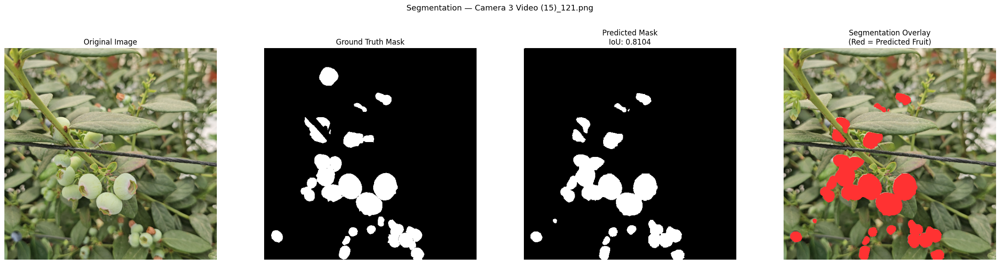

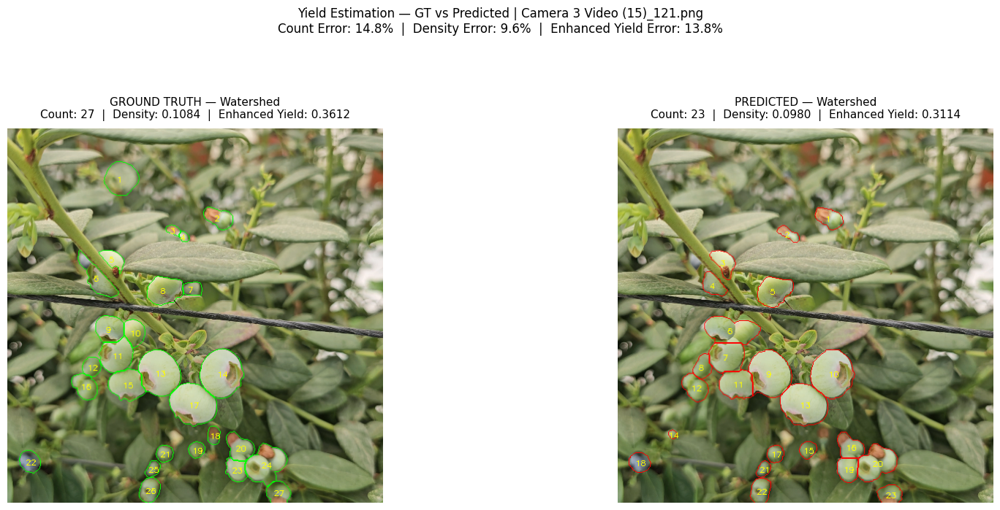

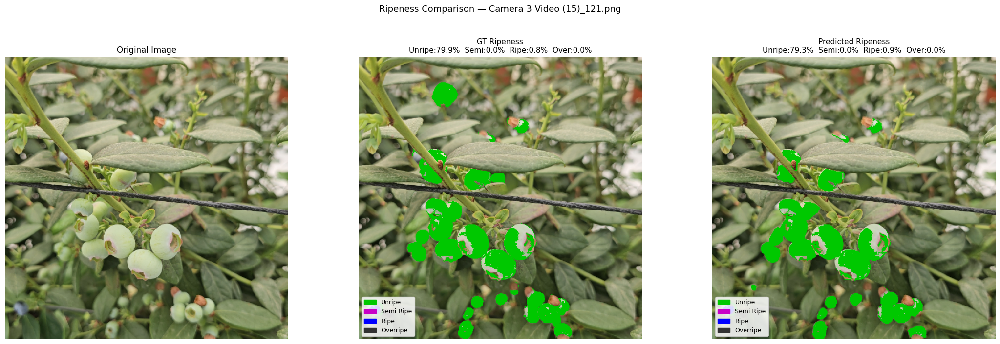

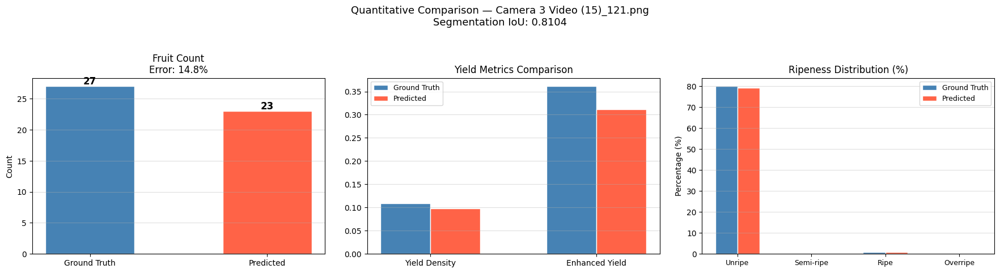


  SUMMARY — Camera 3 Video (15)_121.png
  Metric                                   GT          Pred     Error
  ---------------------------------------------------------------
  Segmentation IoU                          —        0.8104         —
  Fruit Count                              27            23     14.8%
  Yield Density                        0.1084        0.0980      9.6%
  Enhanced Yield Index                 0.3612        0.3114     13.8%
  ---------------------------------------------------------------
  RIPENESS (%)
  Unripe                                79.9%         79.3%
  Semi-ripe                              0.0%          0.0%
  Ripe                                   0.8%          0.9%
  Overripe                               0.0%          0.0%



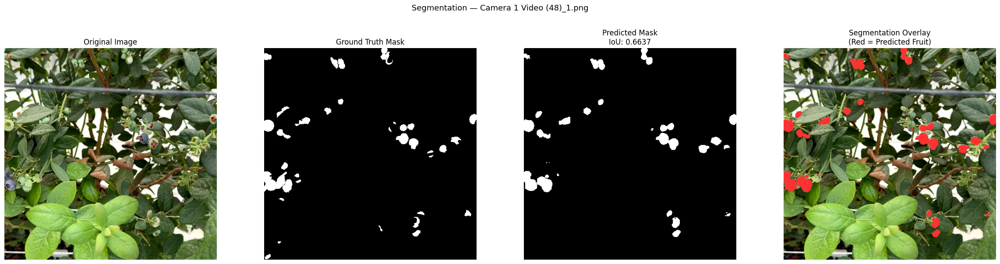

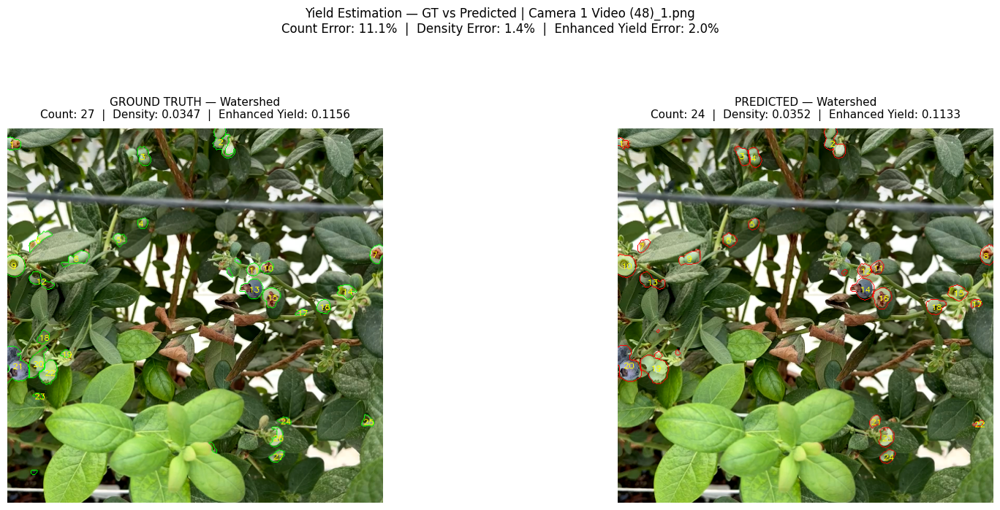

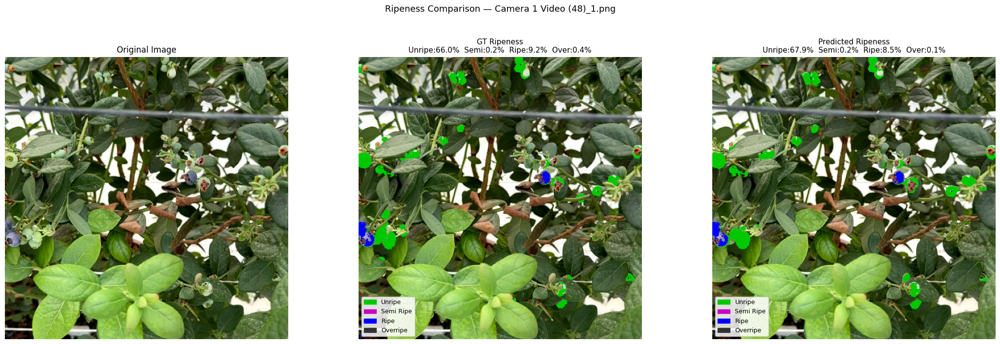

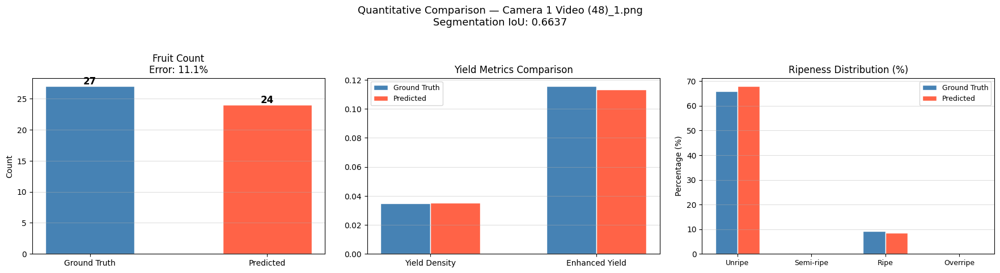


  SUMMARY — Camera 1 Video (48)_1.png
  Metric                                   GT          Pred     Error
  ---------------------------------------------------------------
  Segmentation IoU                          —        0.6637         —
  Fruit Count                              27            24     11.1%
  Yield Density                        0.0347        0.0352      1.4%
  Enhanced Yield Index                 0.1156        0.1133      2.0%
  ---------------------------------------------------------------
  RIPENESS (%)
  Unripe                                66.0%         67.9%
  Semi-ripe                              0.2%          0.2%
  Ripe                                   9.2%          8.5%
  Overripe                               0.4%          0.1%



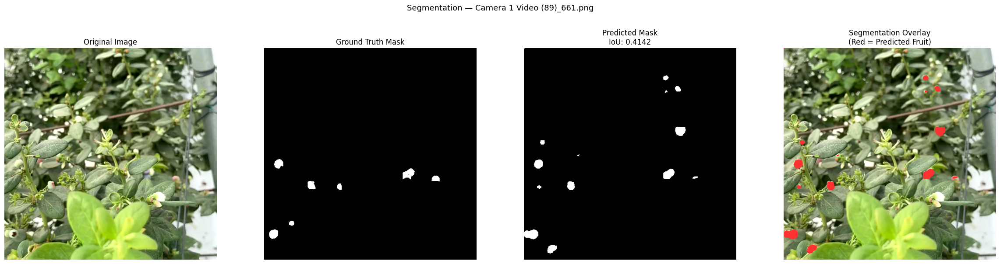

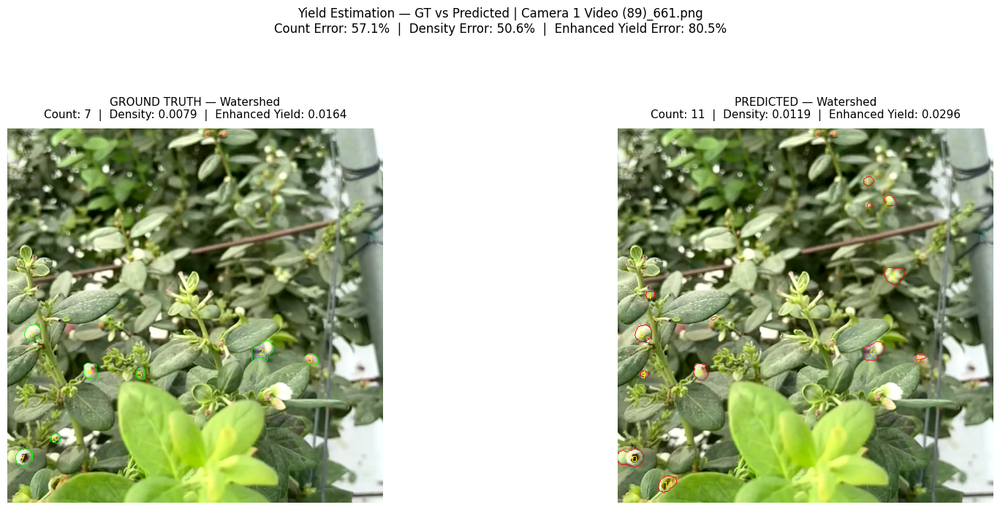

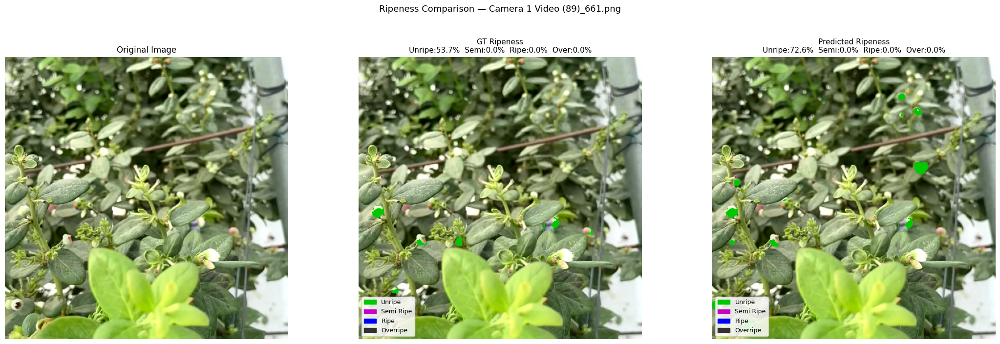

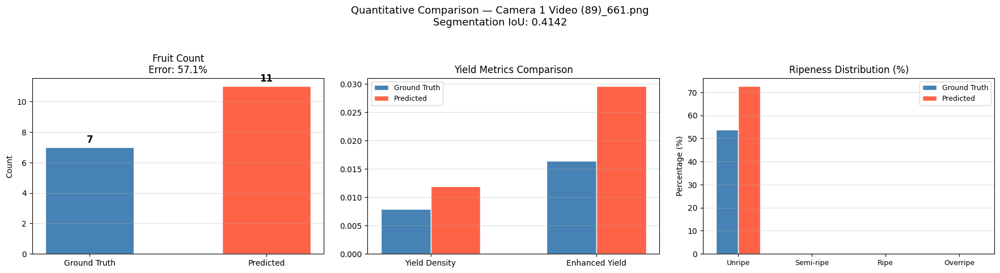


  SUMMARY — Camera 1 Video (89)_661.png
  Metric                                   GT          Pred     Error
  ---------------------------------------------------------------
  Segmentation IoU                          —        0.4142         —
  Fruit Count                               7            11     57.1%
  Yield Density                        0.0079        0.0119     50.6%
  Enhanced Yield Index                 0.0164        0.0296     80.5%
  ---------------------------------------------------------------
  RIPENESS (%)
  Unripe                                53.7%         72.6%
  Semi-ripe                              0.0%          0.0%
  Ripe                                   0.0%          0.0%
  Overripe                               0.0%          0.0%



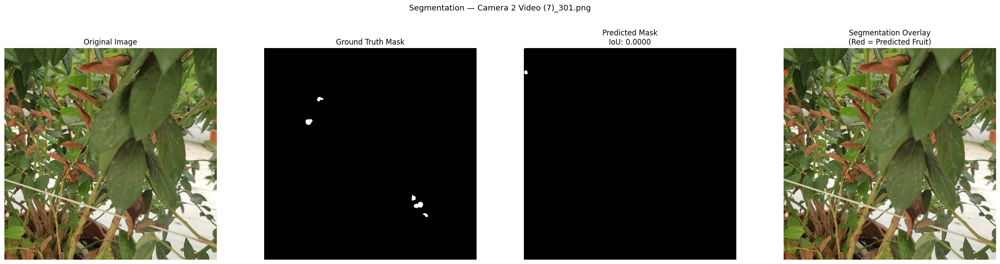

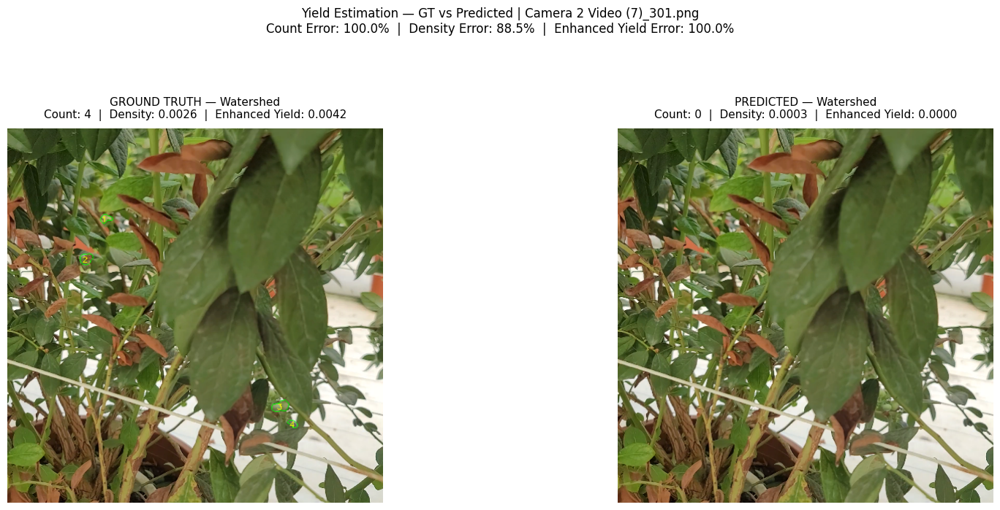

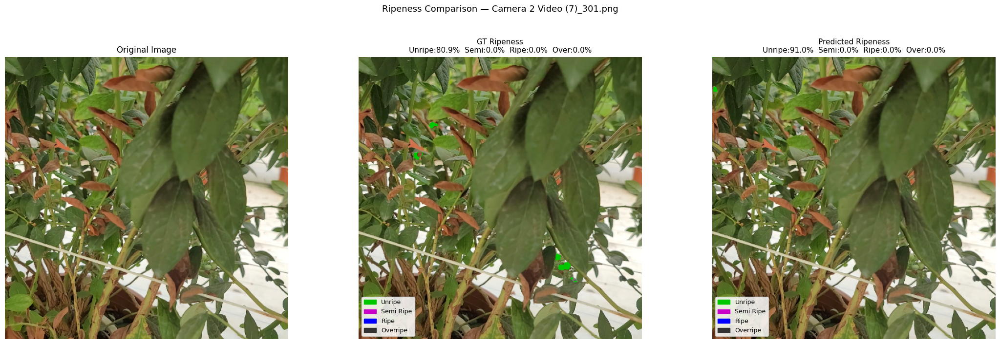

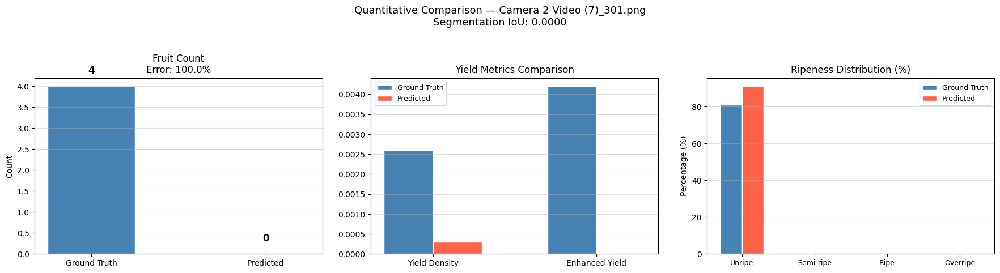


  SUMMARY — Camera 2 Video (7)_301.png
  Metric                                   GT          Pred     Error
  ---------------------------------------------------------------
  Segmentation IoU                          —        0.0000         —
  Fruit Count                               4             0    100.0%
  Yield Density                        0.0026        0.0003     88.5%
  Enhanced Yield Index                 0.0042        0.0000    100.0%
  ---------------------------------------------------------------
  RIPENESS (%)
  Unripe                                80.9%         91.0%
  Semi-ripe                              0.0%          0.0%
  Ripe                                   0.0%          0.0%
  Overripe                               0.0%          0.0%



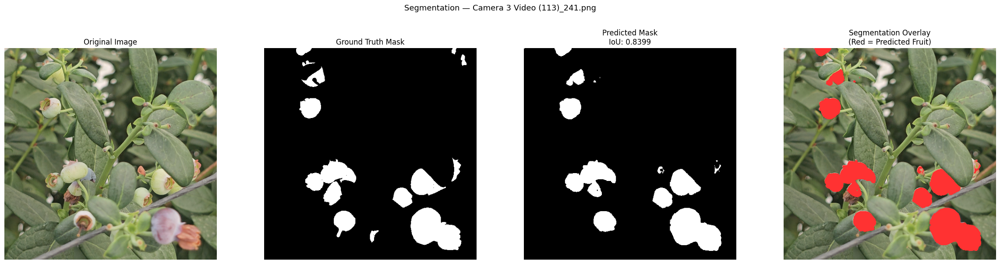

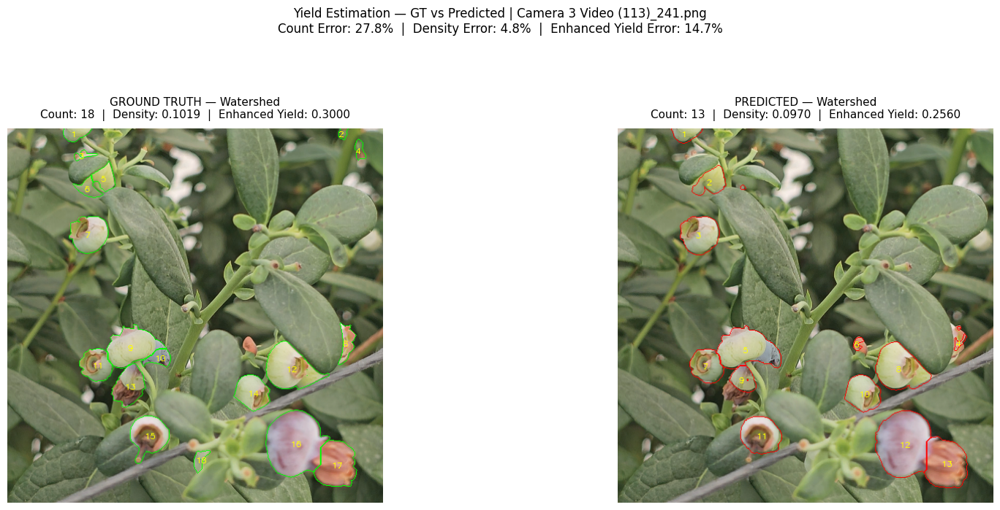

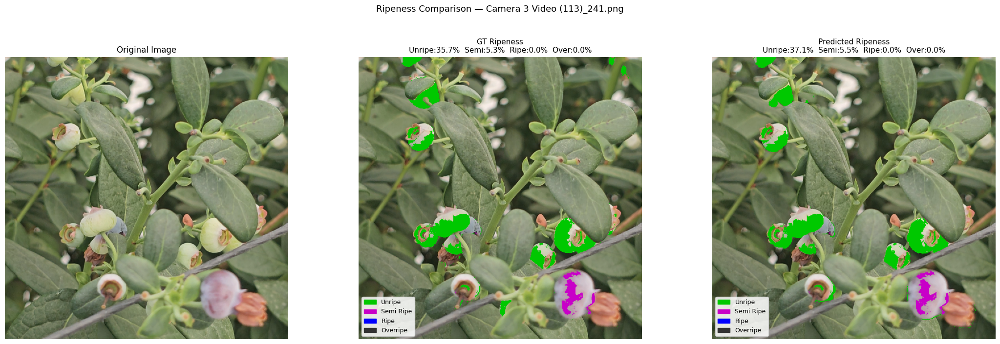

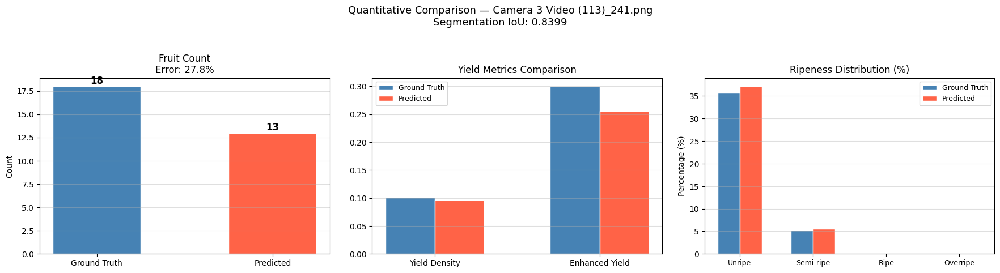


  SUMMARY — Camera 3 Video (113)_241.png
  Metric                                   GT          Pred     Error
  ---------------------------------------------------------------
  Segmentation IoU                          —        0.8399         —
  Fruit Count                              18            13     27.8%
  Yield Density                        0.1019        0.0970      4.8%
  Enhanced Yield Index                 0.3000        0.2560     14.7%
  ---------------------------------------------------------------
  RIPENESS (%)
  Unripe                                35.7%         37.1%
  Semi-ripe                              5.3%          5.5%
  Ripe                                   0.0%          0.0%
  Overripe                               0.0%          0.0%



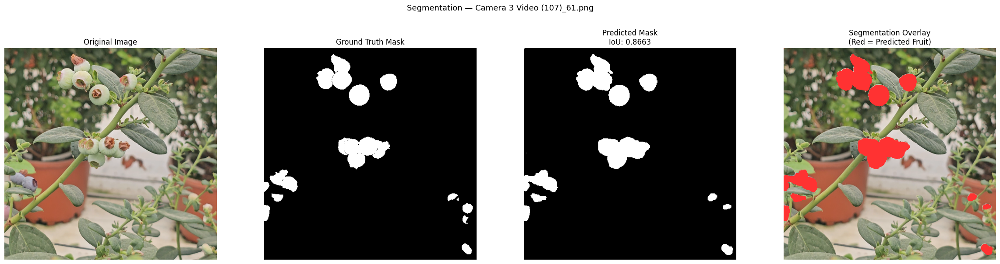

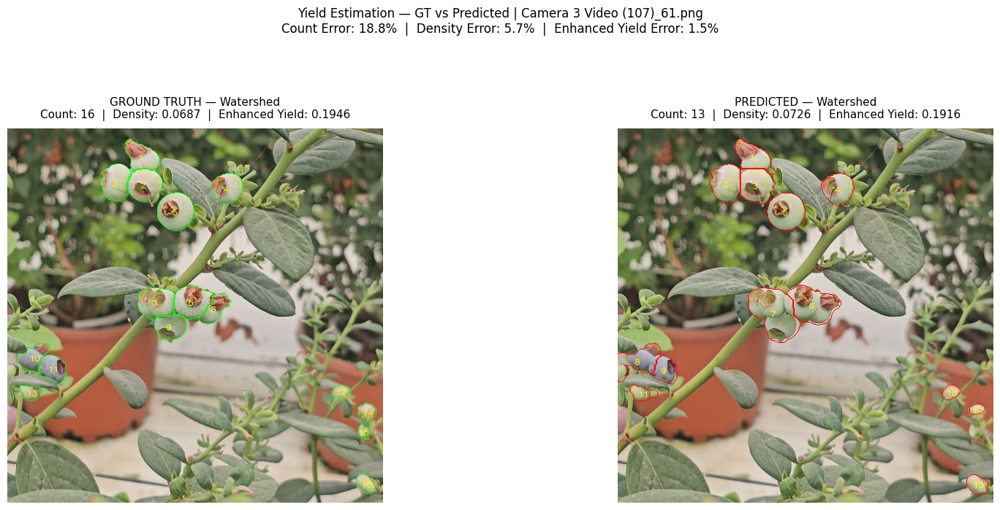

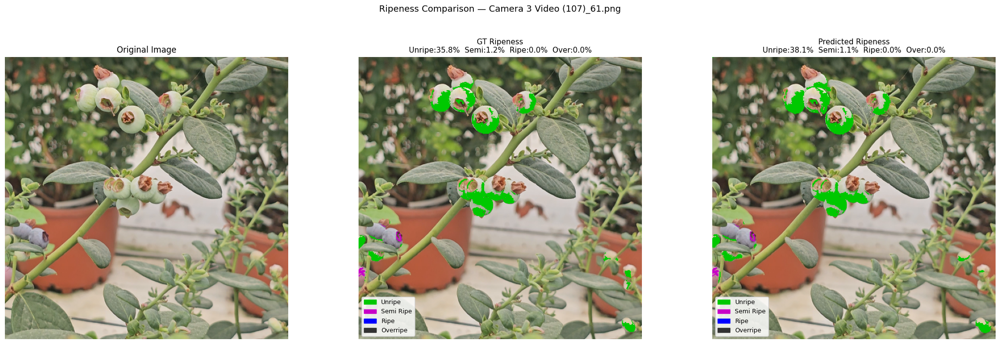

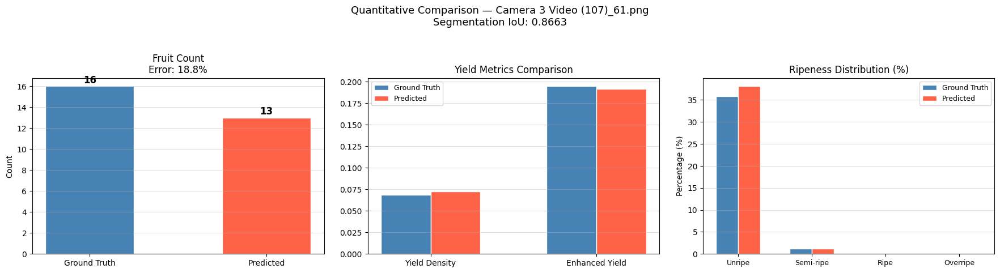


  SUMMARY — Camera 3 Video (107)_61.png
  Metric                                   GT          Pred     Error
  ---------------------------------------------------------------
  Segmentation IoU                          —        0.8663         —
  Fruit Count                              16            13     18.8%
  Yield Density                        0.0687        0.0726      5.7%
  Enhanced Yield Index                 0.1946        0.1916      1.5%
  ---------------------------------------------------------------
  RIPENESS (%)
  Unripe                                35.8%         38.1%
  Semi-ripe                              1.2%          1.1%
  Ripe                                   0.0%          0.0%
  Overripe                               0.0%          0.0%


  OVERALL PIPELINE VALIDATION STATISTICS
  Images evaluated         : 6
  Mean Seg IoU             : 0.5991
  Mean Count Error         : 38.3%
  Mean Yield Density Error : 26.8%
  Mean Enhanced Yield Err  : 35.4%


In [ ]:
# Run on 6 random test images
comparison_results = []
for name in random.sample(test_imgs, min(6, len(test_imgs))):
    r = run_comparison_pipeline(
        name, threshold=best_thresh, save_fig=True
    )
    comparison_results.append(r)
    print()

# Overall statistics
print("\n" + "=" * 65)
print("  OVERALL PIPELINE VALIDATION STATISTICS")
print("=" * 65)
print(f"  Images evaluated         : {len(comparison_results)}")
print(f"  Mean Seg IoU             : "
      f"{np.mean([r['seg_iou'] for r in comparison_results]):.4f}")
print(f"  Mean Count Error         : "
      f"{np.mean([r['count_error_pct'] for r in comparison_results]):.1f}%")
print(f"  Mean Yield Density Error : "
      f"{np.mean([r['density_error_pct'] for r in comparison_results]):.1f}%")
print(f"  Mean Enhanced Yield Err  : "
      f"{np.mean([r['enhanced_err_pct'] for r in comparison_results]):.1f}%")
print("=" * 65)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install gradio

In [3]:
import gradio as gr
import cv2
import numpy as np
import tensorflow as tf
from scipy import ndimage
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

# ================== LOAD MODEL ==================
model = tf.keras.models.load_model("/content/drive/MyDrive/Blueberry-Dataset/baseline_model.keras", compile=False)

# ================== PREDICT FUNCTION ==================
def predict(image):
    img = np.array(image)

    # Resize + normalize
    img_resized = cv2.resize(img, (512, 512))
    img_norm = img_resized.astype(np.float32) / 255.0

    # Predict
    prob = model.predict(img_norm[np.newaxis], verbose=0)[0, :, :, 0]
    pred = (prob > 0.25).astype(np.uint8)

    # Resize back
    pred = cv2.resize(pred, (img.shape[1], img.shape[0]))

    # ================== WATERSHED (COUNT) ==================
    mask = (pred > 0).astype(np.uint8)

    dist = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
    coords = peak_local_max(dist, min_distance=15, labels=mask)

    m = np.zeros(dist.shape, dtype=bool)
    if len(coords) > 0:
        m[tuple(coords.T)] = True

    markers, _ = ndimage.label(m)
    labels = watershed(-dist, markers, mask=mask)

    fruit_count = max(len(np.unique(labels)) - 1, 0)

    # ================== YIELD ==================
    total_pixels = pred.size
    fruit_pixels = int(np.sum(pred > 0))

    yield_density = fruit_pixels / total_pixels
    enhanced_yield = yield_density * np.log1p(fruit_count)

    # ================== RIPENESS ==================
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    mask_bool = pred > 0
    total_fruit_px = np.sum(mask_bool)

    ripeness_ranges = {
        "Unripe": [(25, 40, 40), (85, 255, 255)],
        "Semi-ripe": [(140, 40, 40), (175, 255, 255)],
        "Ripe": [(100, 40, 30), (140, 255, 255)],
        "Overripe": [(100, 40, 0), (140, 255, 40)],
    }

    ripeness_percent = {}

    for stage, (lo, hi) in ripeness_ranges.items():
        mask_stage = cv2.inRange(hsv, np.array(lo), np.array(hi))
        combined = mask_stage & (mask_bool.astype(np.uint8) * 255)
        count = np.sum(combined > 0)

        pct = (count / total_fruit_px * 100) if total_fruit_px > 0 else 0
        ripeness_percent[stage] = round(pct, 2)

    # ================== VISUALS ==================

    # Mask
    mask_img = (pred * 255).astype(np.uint8)

    # Overlay (red)
    overlay = img.copy()
    overlay[pred == 1] = [255, 0, 0]

    # Fruit highlighting (green circles)
    highlight = img.copy()
    for label in np.unique(labels):
        if label == 0:
            continue

        comp = (labels == label).astype(np.uint8)
        contours, _ = cv2.findContours(comp, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            (x, y), radius = cv2.minEnclosingCircle(contours[0])
            center = (int(x), int(y))
            radius = int(radius)

            if radius > 5:
                cv2.circle(highlight, center, radius, (255, 0, 0), 2)

    # ================== OUTPUT TEXT ==================
    result_text = f"""
Yield Density       : {yield_density:.4f}
Fruit Count         : {fruit_count}
Enhanced Yield Index: {enhanced_yield:.4f}

Ripeness (%):
Unripe     : {ripeness_percent['Unripe']}%
Semi-ripe  : {ripeness_percent['Semi-ripe']}%
Ripe       : {ripeness_percent['Ripe']}%
Overripe   : {ripeness_percent['Overripe']}%
"""

    return img, mask_img, overlay, highlight, result_text


# ================== UI ==================
with gr.Blocks(theme=gr.themes.Soft()) as demo:

    gr.Markdown("## 🌿 Blueberry Yield & Ripeness Estimation")

    # Upload
    input_img = gr.Image(label="Upload Image", type="pil", height = 250)

    btn = gr.Button("Run Analysis", variant="primary")

    # -------- Images Section --------
    gr.Markdown("### Segmentation Results")

    with gr.Row():
        out_original = gr.Image(label="Original", height=250)
        out_mask = gr.Image(label="Mask", height=250)
        out_overlay = gr.Image(label="Overlay", height=250)

    gr.Markdown("### Fruit Detection")

    out_highlight = gr.Image(label="Detected Fruits (Red Circles)", height=300)

    # -------- Metrics Section --------
    gr.Markdown("### Analysis Results")

    output_text = gr.Textbox(
        label="Results",
        lines=8,
        interactive=False
    )

    # Button action
    btn.click(
        fn=predict,
        inputs=input_img,
        outputs=[out_original, out_mask, out_overlay, out_highlight, output_text]
    )

demo.launch(share=True)

/tmp/ipykernel_8171/1891787307.py:114: DeprecationWarning: The 'theme' parameter in the Blocks constructor will be removed in Gradio 6.0. You will need to pass 'theme' to Blocks.launch() instead.
  with gr.Blocks(theme=gr.themes.Soft()) as demo:


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://3b890cfd8b4c79b490.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
